We will first import the required libraries and the dataset. We will then do exploratory data analysis to see if we can find any trends in the dataset. Next, we will perform text preprocessing to convert textual data to numeric data that can be used by a machine learning algorithm. Finally, we will use machine learning algorithms to train and test our sentiment analysis models.

# Data Understanding

In [ ]:
!pip install emot==2.1
# !pip install nltk
# import nltk 
# nltk.download('wordnet')
# nltk.download('stopwords')
# !pip install imbalanced-learn
# !pip install delayed
# !pip install wordcloud
# !pip install seaborn

In [ ]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import re
import nltk 
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV
import sklearn
from sklearn.model_selection import train_test_split
import emot
from nltk.corpus import stopwords
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.naive_bayes import MultinomialNB
from numpy import mean
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.metrics import make_scorer, r2_score, balanced_accuracy_score, precision_score, recall_score, f1_score
import pickle
from sklearn import svm
from sklearn.naive_bayes import MultinomialNB
import itertools
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
nltk.download('stopwords')
from wordcloud import WordCloud,STOPWORDS

import warnings
warnings.filterwarnings("ignore") 
%matplotlib inline

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# import tensorflow as tf

# # Get the GPU device name.
# device_name = tf.test.gpu_device_name()

# # The device name should look like the following:
# if device_name == '/device:GPU:0':
#     print('Found GPU at: {}'.format(device_name))
# else:
#     raise SystemError('GPU device not found')

## Data Loading

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Tweets.csv to Tweets.csv


In [ ]:
import io
df = pd.read_csv(io.BytesIO(uploaded['Tweets.csv']))
#df = pd.read_csv('Tweets.csv')

In [ ]:
df.shape

(14640, 15)

In [ ]:
df.columns

Index(['tweet_id', 'airline_sentiment', 'airline_sentiment_confidence',
       'negativereason', 'negativereason_confidence', 'airline',
       'airline_sentiment_gold', 'name', 'negativereason_gold',
       'retweet_count', 'text', 'tweet_coord', 'tweet_created',
       'tweet_location', 'user_timezone'],
      dtype='object')

In [ ]:
df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


## Missing value

The first step should be to check the shape of the dataframe and then check the number of null values in each column.
In this way we can get an idea of the redundant columns in the data frame depending on which columns have the highest number of null values.

In [ ]:
print("Shape of the dataframe is",df.shape)
print("\nThe number of nulls in each column are\n\n", df.isna().sum())

Shape of the dataframe is (14640, 15)

The number of nulls in each column are

 tweet_id                            0
airline_sentiment                   0
airline_sentiment_confidence        0
negativereason                   5462
negativereason_confidence        4118
airline                             0
airline_sentiment_gold          14600
name                                0
negativereason_gold             14608
retweet_count                       0
text                                0
tweet_coord                     13621
tweet_created                       0
tweet_location                   4733
user_timezone                    4820
dtype: int64


In [ ]:
# To get a better idea, lets calculate the percentage of nulls or NA values in each column
print("Percentage null or na values in the dataset")
((df.isnull() | df.isna()).sum() * 100 / df.index.size).round(2)

Percentage null or na values in the dataset


tweet_id                         0.00
airline_sentiment                0.00
airline_sentiment_confidence     0.00
negativereason                  37.31
negativereason_confidence       28.13
airline                          0.00
airline_sentiment_gold          99.73
name                             0.00
negativereason_gold             99.78
retweet_count                    0.00
text                             0.00
tweet_coord                     93.04
tweet_created                    0.00
tweet_location                  32.33
user_timezone                   32.92
dtype: float64

In [ ]:
# tweet_coord , airline_sentiment_gold, negativereason_gold have more than 90% missing data. 
# It will be better to delete these columns as they will not provide any constructive information.
del df['tweet_coord']
del df['airline_sentiment_gold']
del df['negativereason_gold']
df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,name,retweet_count,text,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,cairdin,0,@VirginAmerica What @dhepburn said.,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,jnardino,0,@VirginAmerica plus you've added commercials t...,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,yvonnalynn,0,@VirginAmerica I didn't today... Must mean I n...,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,jnardino,0,@VirginAmerica it's really aggressive to blast...,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,jnardino,0,@VirginAmerica and it's a really big bad thing...,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


## Airline sentiments

Firstly lets see distribution of sentiments across all the tweets.

Then, we are going to get the barplots for each airline with respect to sentiments of tweets (positive,negative or neutral).

This will give us a clearer idea about the airline sentiments, airlines relationship.

In [ ]:
# Majority of the tweets are negative, followed by neutral tweets, and then the positive tweets.
df['airline_sentiment'].value_counts()

negative    9178
neutral     3099
positive    2363
Name: airline_sentiment, dtype: int64

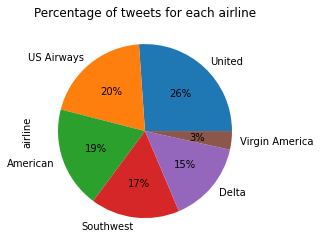

In [ ]:
# In the output, you can see the percentage of public tweets for each airline. 
# United Airline has the highest number of tweets i.e. 26%, followed by US Airways (20%).
df['airline'].value_counts().plot(kind='pie', autopct='%1.0f%%', title='Percentage of tweets for each airline')

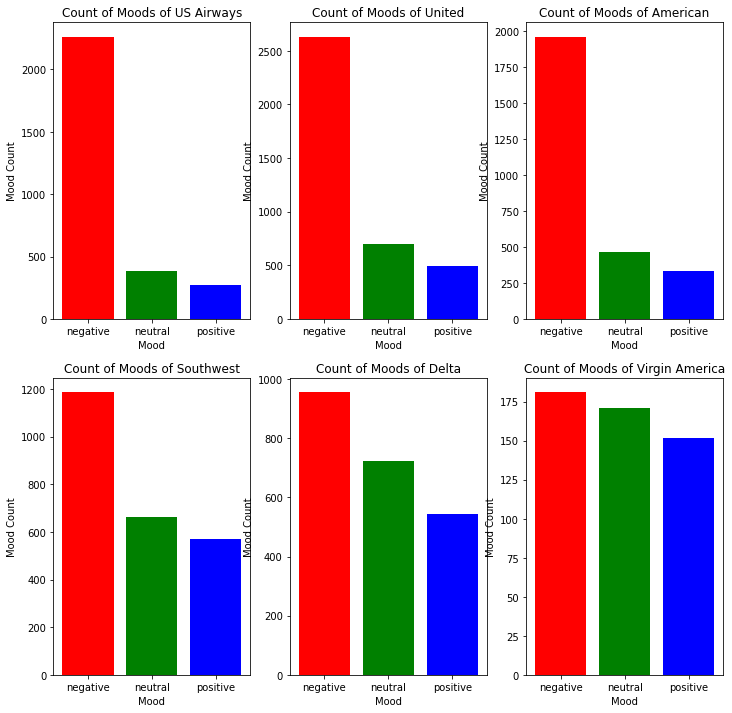

In [ ]:
# Distribution of sentiment for each individual airline,
def plot_sub_sentiment(Airline):
    df_count=df[df['airline']==Airline]
    count=df_count['airline_sentiment'].value_counts()
    Index = [1,2,3]
    plt.bar(Index, count, color=['red', 'green', 'blue'])
    plt.xticks(Index, ['negative','neutral','positive'])
    plt.ylabel('Mood Count')
    plt.xlabel('Mood')
    plt.title('Count of Moods of '+ Airline)
    
plt.figure(1,figsize=(12, 12))
plt.subplot(231)
plot_sub_sentiment('US Airways')
plt.subplot(232)
plot_sub_sentiment('United')
plt.subplot(233)
plot_sub_sentiment('American')
plt.subplot(234)
plot_sub_sentiment('Southwest')
plt.subplot(235)
plot_sub_sentiment('Delta')
plt.subplot(236)
plot_sub_sentiment('Virgin America')

# From the below plots one can find that the distribution of moods for the first three airlines are always skewed toward negative moods. 
# On contrary, the moods are distributed more balanced with the later three airline companies (SouthWest, Delta, Virgin America).
# United, US Airways, American substantially get negative reactions.
# Tweets for Virgin America are the most balanced where the ratio of the three sentiments is somewhat similar.

In [ ]:
# Counting the total number of negative reasons
df['negativereason'].value_counts()

Customer Service Issue         2910
Late Flight                    1665
Can't Tell                     1190
Cancelled Flight                847
Lost Luggage                    724
Bad Flight                      580
Flight Booking Problems         529
Flight Attendant Complaints     481
longlines                       178
Damaged Luggage                  74
Name: negativereason, dtype: int64

Text(0, 0.5, 'No. of Tweets')

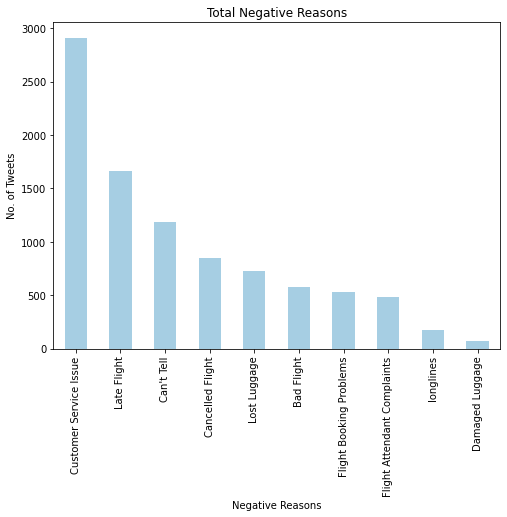

In [ ]:
# Plotting all the negative reasons 
pd.Series(df["negativereason"]).value_counts().plot(kind="bar", colormap='Paired', figsize=(8,6), title="Total Negative Reasons")
plt.xlabel('Negative Reasons', fontsize=10)
plt.ylabel('No. of Tweets', fontsize=10)

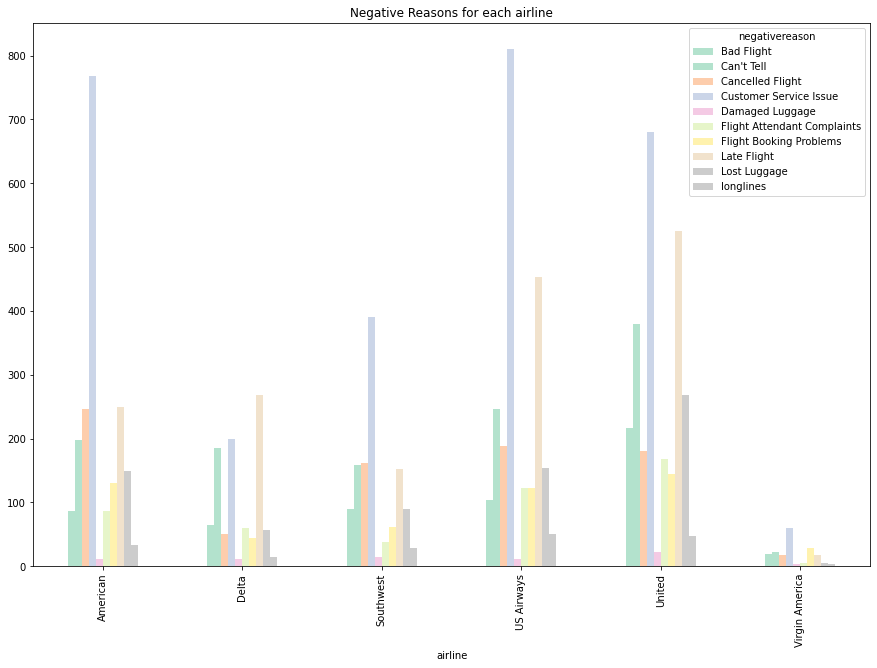

In [ ]:
# Reasons for negative sentimental tweets for each airline
airline_sentiment = df.groupby(['airline', 'negativereason']).airline_sentiment.count().unstack()
airline_sentiment.plot(kind='bar', colormap='Pastel2', figsize=(15,10), title = "Negative Reasons for each airline")

# Customer Service Issue is the main neagtive reason for US Airways, United, American, Southwest, Virgin America
# Late Flight is the main negative reason for Delta
# Interestingly, Virgin America has the least count of negative reasons (all less than 60)
# Contrastingly to Virgin America, airlines like US Airways, United, American have more than 500 negative reasons (Late flight, Customer Service Issue)

## WordCloud
The goal is to firstly get an idea of the most frequent words in negative tweets and positive tweets.

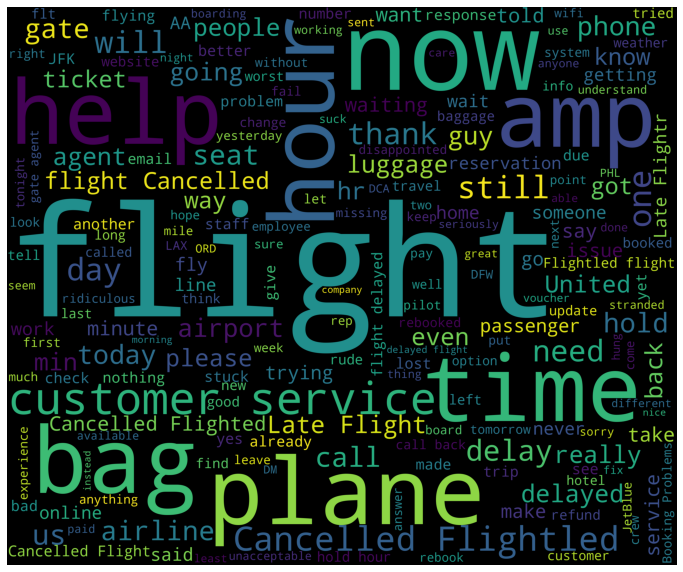

In [ ]:
negwordcloud_df=df[df['airline_sentiment']=='negative']
words = ' '.join(negwordcloud_df['text'])
cleaned_word = " ".join([word for word in words.split()
                         if 'http' not in word
                         and not word.startswith('@')
                         and word != 'RT'])

wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', width=3000, height=2500).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

# We can find that the Tweets with negative moods are frequently involved some words like cancelled, flight ,customer or hour. 
# People might guess that customer tends to complain when they are waiting for the delayed flights.

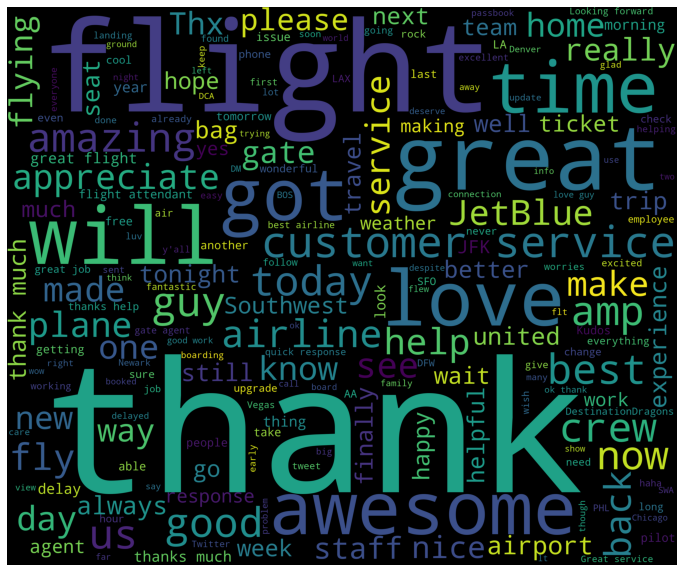

In [ ]:
new_df=df[df['airline_sentiment']=='positive']
words = ' '.join(new_df['text'])
cleaned_word = " ".join([word for word in words.split()
                         if 'http' not in word
                         and not word.startswith('@')
                         and word != 'RT'])

wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', width=3000, height=2500).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

# Words like thank, great, customer, love are understandably present in the most frequent words of positive tweets.

# Supervised Learning

Random Forest

The Random Forest algorithm consists of a large number of individual decision trees that operates in an ensemble manner. The class predictions will be obtained from the most votes from each decision trees. Random Forest works well because of the large number of uncorrelated models operating as a group to outperform any individual models. The trees will protect each other from their individual errors and will eventually all move to the correct direction as a group. For Random Forest to perform well, each individual trees need to have low correlation with each other.

 Multinomial Naive Bayes

Naive Bayes (NB) is based on Bayes theorem that can be used for classification challenges. Multinomial Naives Bayes (MNB) is a variant of NB which is a probabilistic learning method mostly used in Natural Language Processing (NLP). MNB performs calculation of probabilities based on probabilities of causal factors and is useful to model feature vectors where each value represents the number of occurence of a term, where in the case of NLP a text can be considered as a particular instance of a dictionary and the relative frequency of all terms provide enough information to infer a belonging class.


Support Vector Machine

SVM is a supervised machine learning algorithm that can be used for both classification or regression challenges. Classification is predicting a label/group and Regression is predicting a continuous value. SVM performs classification by finding the hyper-plane that differentiate the classes in n-dimensional space. We will build a simple, linear Support-Vector-Classifier (SVC) which implemented in terms of liblinear rather than libsvm. It is just a thin wrapper around libsvm but has more flexibility in the choice of penalties and loss functions and should scale better to large numbers of samples. The classifier will take into account each unique word present in the sentence, as well as all consecutive words. 


## Converting Emoticons to Text
Emoticons are textual portrayals of a writer's moods or facial expressions in the form of icons. Originally, these icons consisted of ASCII art, and later, Shift JIS art and Unicode art. Since these emoticons are used to convey sentiment and emotions, emoticons might have an impact on sentiment analysis. Therefore emoticons need to be converted into textual form to be analysis.

The below function detects emoticons inside strings by comparing them to the emot library database, and then replaces emoticon part of the string with it's textual meaning. An example is converting ":-)" to "Happy face smiley".

In [ ]:
def demotifi(text):
    #ans = emot.core.emot().emoticons(text)
    ans = emot.emoticons(text)
    if isinstance(ans, list):
        flag = ans[0].get('flag')
    if isinstance(ans, dict)  :
        flag = ans.get('flag')
        
    while flag == True: 
        text= text[:ans['location'][0][0]] + ans['mean'][0] + text[ans['location'][0][1]:]
        #ans = emot.core.emot().emoticons(text)  
        ans = emot.emoticons(text)
        if isinstance(ans, list):
            flag = ans[0].get('flag')
        if isinstance(ans, dict)  :
            flag = ans.get('flag')
    return text

An example to demonstrate the process of the function.

In [ ]:
testString= "Wowers ;) :-) 👨"
newString = demotifi(testString)
print(newString)

Wowers Wink or smirk Happy face smiley 👨


In [ ]:
df['text'] = df['text'].apply(demotifi)

## Converting Emojis to Text
Emojis are pictograms, logograms, ideograms and smileys used in electronic messages and web pages. The emoji's primary function is to fill in emotional cues otherwise missing from typed conversation. They evolved from basic emoticons into a more complex and format rich depictions. Since they fulfill similar functions to emoticons in conveying sentiment and emotions, it is required to convert them to thier textual meaning for improved sentiment analysis

The below function detects emojis inside strings by comparing them to the emot library database, and then replaces emoji part of the string with it's textual meaning. An example is converting "👨" to "man".

In [ ]:
def demojifi(text):
    #ans = emot.core.emot().emoji(text)
    ans = emot.emoji(text)
    if isinstance(ans, list):
        flag = ans[0].get('flag')
    if isinstance(ans, dict)  :
        flag = ans.get('flag')
        
    while flag == True: 
        text= text[:ans['location'][0][0]] + ' '+ ans['mean'][0][1:-1] + ' ' + text[ans['location'][0][1]+ 1:]
        #ans = emot.core.emot().emoji(text)
        ans = emot.emoji(text)
        if isinstance(ans, list):
            flag = ans[0].get('flag')
        if isinstance(ans, dict)  :
            flag = ans.get('flag')
    return text

An example to demonstrate the process of the function.

In [ ]:
testString= "Wowers ;) :-) 👨"
newString = demojifi(testString)
print(newString)

Wowers ;) :-)  man 


In [ ]:
df['text'] = df['text'].apply(demojifi)

## Text Preprocessing
In order to have an effective and efficient, the text needs to be preprocessed to fit the models and remove uneccessary features.

###Converting to lowercase
The text is converted to an all lowercase format in order to normalize the text.

In [ ]:
df['text'] = df['text'].apply(lambda x: " ".join(x.lower() for x in x.split()))

###Mentions Removal
Since Tweet mentions do not contribute at all to sentiment analysis, they are removed from the text.

In [ ]:
def remove_mentions(input_text):
        return re.sub(r'@\w+', '', input_text)

In [ ]:
df['text'] = df['text'].apply(remove_mentions)

###Removing hyperlinks and punctuations
Since hyperlinks and punctuations do not contribue to sentiment analysis, they are removed from the text.

In [ ]:
df['text'] = df['text'].apply(lambda x: re.sub(r'http\S+', '', x))
df['text'] = df['text'].str.replace('[^\w\s]','')

### Removing numbers, whitespace, next line and unnecessary formats

In [ ]:
emoji_pat = '[\U0001F300-\U0001F64F\U0001F680-\U0001F6FF\u2600-\u26FF\u2700-\u27BF]'
shrink_whitespace_reg = re.compile(r'\s{2,}')

reg = re.compile(r'({})|[^a-zA-Z]'.format(emoji_pat))
    
df['text'] = df['text'].apply(lambda x: shrink_whitespace_reg.sub(' ', x))
df['text'] = df['text'].apply(lambda x: re.sub(r'\\n', '', x))
df['text'] = df['text'].apply(lambda x: re.sub(r'[0-9]', '', x))

### Stopword Removal
Since most stopwords do not contribute to sentiment analysis, stopwords are removed from the text with a few exceptions.

The function below removes english stopwords from the text with the exception of "n't", "not" and "no", since these negations can drastically change the sentiment of a text. An example is "happy" is a positive sentiment, while "not happy" is a negative sentiment due to the "not" negating the meaning of "happy".

In [ ]:
def remove_stopwords(input_text):
        stopwords_list = stopwords.words('english')
        # Some words which might indicate a certain sentiment are kept via a whitelist
        whitelist = ["n't", "not", "no"]
        words = input_text.split() 
        clean_words = [word for word in words if (word not in stopwords_list or word in whitelist) and len(word) > 1] 
        return " ".join(clean_words) 

In [ ]:
df['text'] = df['text'].apply(remove_stopwords)

##Lemmatization

In [ ]:
def lemma(text):
    lemmatizer = WordNetLemmatizer()
    return lemmatizer.lemmatize(text)

df['lemmatized'] = df['text'].apply(lambda x: " ".join(lemma(x) for x in x.split()))

In [ ]:
df['lemmatized'].head()

0                                                 said
1         plus youve added commercial experience tacky
2         didnt today must mean need take another trip
3    really aggressive blast obnoxious entertainmen...
4                                 really big bad thing
Name: lemmatized, dtype: object

In [ ]:
df['lemmatized'][0]

'said'

### Label Encoding

In [ ]:
df['sentiment']= df['airline_sentiment'].apply(lambda x: 0 if x=='negative' else 1 if x=='neutral' else 2)

In [ ]:
print(df['sentiment'])

0        1
1        2
2        1
3        0
4        0
        ..
14635    2
14636    0
14637    1
14638    0
14639    1
Name: sentiment, Length: 14640, dtype: int64


In [ ]:
X_data = df['lemmatized']
y_data = df['sentiment']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.2, random_state=42)

###Count Vectorizer

In [ ]:
def count_vec(train_clean_tweet, test_clean_tweet, ngram, max_feature):
    
    if ngram == 'Unigram':
        count_vectorizer = CountVectorizer(analyzer = "word", ngram_range = (1,1), max_features = max_feature)
    elif ngram == 'Bigram':
        count_vectorizer = CountVectorizer(analyzer = "word", ngram_range = (2,2), max_features = max_feature)
    elif ngram == 'Trigram':
        count_vectorizer = CountVectorizer(analyzer = "word", ngram_range = (3,3), max_features = max_feature)
    else:
        return 0
        
    train_features= count_vectorizer.fit_transform(train_clean_tweet)
    test_features=count_vectorizer.transform(test_clean_tweet)
    # print(train_features)
    print('Vocabulary length :', len(count_vectorizer.get_feature_names()))
    vocab = count_vectorizer.get_feature_names()
    pd.set_option('display.max_columns', None)
    train_features_array = train_features.toarray()
    grams = pd.DataFrame(train_features_array, columns = vocab).head()
    display(grams)
    
    return train_features, test_features, count_vectorizer

In [ ]:
def count_vec(train_clean_tweet, test_clean_tweet, ngram, max_feature):
    
    if ngram == 'Unigram':
        count_vectorizer = CountVectorizer(analyzer = "word", ngram_range = (1,1), max_features = max_feature)
    elif ngram == 'Bigram':
        count_vectorizer = CountVectorizer(analyzer = "word", ngram_range = (2,2), max_features = max_feature)
    elif ngram == 'Trigram':
        count_vectorizer = CountVectorizer(analyzer = "word", ngram_range = (3,3), max_features = max_feature)
    else:
        return 0
        
    train_features= count_vectorizer.fit_transform(train_clean_tweet)
    test_features=count_vectorizer.transform(test_clean_tweet)
    # print(train_features)
    print('Vocabulary length :', len(count_vectorizer.get_feature_names()))
    vocab = count_vectorizer.get_feature_names()
    pd.set_option('display.max_columns', None)
    train_features_array = train_features.toarray()
    grams = pd.DataFrame(train_features_array, columns = vocab).head()
    display(grams)
    
    return train_features, test_features, count_vectorizer

In [ ]:
train_features, test_features, count_vectorizer = count_vec(X_train, X_test, 'Unigram', 5000) #Bigram, Trigram

Vocabulary length : 5000


aa  aaba  aadfw  aadvantage  aafail  aal  abc  ability  able  aboard  abq  \
0   0     0      0           0       0    0    0        0     0       0    0   
1   0     0      0           0       0    0    0        0     0       0    0   
2   0     0      0           0       0    0    0        0     0       0    0   
3   0     0      0           0       0    0    0        0     0       0    0   
4   0     0      0           0       0    0    0        0     0       0    0   

   absolute  absolutely  absurd  abt  abused  abysmal  ac  accept  acceptable  \
0         0           0       0    0       0        0   0       0           0   
1         0           0       0    0       0        0   0       0           0   
2         0           0       0    0       0        0   0       0           0   
3         0           0       0    0       0        0   0       0           0   
4         0           0       0    0       0        0   0       0           0   

   accepted  accepting  access  accident  accidentally  accommodate  \
0         0          0       0         0             0            0   
1         0          0       0         0             0            0   
2         0          0       0         0             0            0   
3         0          0       0         0             0            0   
4         0          0       0         0             0            0   

   accommodating  accommodation  according  accordingly  account  \
0              0              0          0            0        0   
1              0              0          0            0        0   
2              0              0          0            0        0   
3              0              0          0            0        0   
4              0              0          0            0        0   

   accountability  acct  accts  accurate  acknowledge  acquisition  across  \
0               0     0      0         0            0            0       0   
1               0     0      0         0            0            0       0   
2               0     0      0         0            0            0       0   
3               0     0      0         0            0            0       0   
4               0     0      0         0            0            0       0   

   act  action  active  actual  actually  ad  adam  add  added  adding  \
0    0       0       0       0         0   0     0    0      0       0   
1    0       0       0       0         0   0     0    0      0       0   
2    0       0       0       0         0   0     0    0      0       0   
3    0       0       0       0         0   0     0    0      0       0   
4    0       0       0       0         0   0     0    0      0       0   

   addition  additional  addl  address  addressed  addtl  adjacent  admiral  \
0         0           0     0        0          0      0         0        0   
1         0           0     0        0          0      0         0        0   
2         0           0     0        0          0      0         0        0   
3         0           0     0        0          0      0         0        0   
4         0           0     0        0          0      0         0        0   

   admit  adopted  adopting  adore  advance  advantage  advertise  \
0      0        0         0      0        0          0          0   
1      0        0         0      0        0          0          0   
2      0        0         0      0        0          0          0   
3      0        0         0      0        0          0          0   
4      0        0         0      0        0          0          0   

   advertising  advice  advise  advised  advising  advisory  affect  affected  \
0            0       0       0        0         0         0       0         0   
1            0       0       0        0         0         0       0         0   
2            0       0       0        0         0         0       0         0   
3            0       0       0        0         0         0       0    

## Resampling

Due to the data imbalance between positive, neutral and negative sentiment, resampling techniques are used to address the issue. This is because class imbalance might affect the accuracy and performance of the models.

Therefore, random undersampling is done to reduce the majority class randomly down to the desired ratio against the minority class, and combined with using SMOTE to do oversampling, which is oversampling by creating "synthetic" examples of the minority class.

In [ ]:
over = SMOTE()
under = RandomUnderSampler()
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)
x_transformed, y_transformed = pipeline.fit_resample(train_features, y_train)

## Cross-Validation
10-fold cross validation is done to observe the performance of the various algorithmns on the dataset and which algorithm works well with the dataset by comparing several metrics.

In [ ]:
def cv(models, X, y):
    global metrics_df
    # evaluate each model in turn
    seed=7
    scoring = {
               'balanced_accuracy': 'balanced_accuracy',
               'precision':'precision_weighted',
               'recall':'recall_weighted',
               'roc_auc_ovr': 'roc_auc_ovr',
               'roc_auc_ovo': 'roc_auc_ovo',
               'f1_weighted': 'f1_weighted'
     }
    
    for name, model in models:
        kfold = model_selection.KFold(n_splits=5, random_state=seed, shuffle=True)
        cv_results = model_selection.cross_validate(model, X, y, cv=kfold, scoring=scoring)
        results.append(cv_results['test_balanced_accuracy'])
        names.append(name)
        metrics_list.append(pd.Series({'Algorithm':name, 
                                       'balanced_accuracy':cv_results['test_balanced_accuracy'].mean(),
                                       'precision_score':cv_results['test_precision'].mean(),
                                       'recall_score':cv_results['test_recall'].mean(),
                                       'f1_score':cv_results['test_f1_weighted'].mean(),
                                       'roc_auc_ovo':cv_results['test_roc_auc_ovo'].mean(),
                                       'roc_auc_ovr':cv_results['test_roc_auc_ovr'].mean()
                                      }))
    metrics_df = pd.concat(metrics_list, axis=1).T
    fig = plt.figure(figsize=(20,5))
    fig.suptitle('Algorithm Comparison')
    ax = fig.add_subplot(111)
    plt.boxplot(results)
    ax.set_xticklabels(names)
    plt.show()
    display(metrics_df)

In [ ]:
#for clearing and results
def init_metrics():
    global names
    global results
    global metrics_list
    global metrics_df
 
    names=[]
    results=[]
    metrics_list = list()
    metrics_df = pd.DataFrame()

init_metrics()

In [ ]:
init_metrics()
models = []
models.append(('RandomForest', RandomForestClassifier()))
models.append(('MultinomialNB',MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None)))
models.append(('LinearSVC',svm.SVC(gamma=0.01, C=100., probability=True, class_weight='balanced', kernel='linear')))


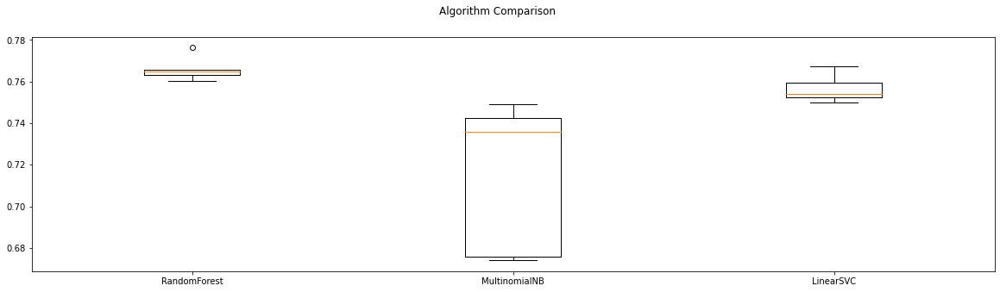

,Algorithm,balanced_accuracy,precision_score,recall_score,f1_score,roc_auc_ovo,roc_auc_ovr
0,RandomForest,0.766036,0.779347,0.765995,0.767552,0.914957,0.914949
1,MultinomialNB,0.715428,0.732325,0.714825,0.70988,0.892998,0.893016
2,LinearSVC,0.756658,0.766188,0.756757,0.757346,0.878005,0.877989


In [ ]:
cv(models, X = x_transformed, y = y_transformed)

## Fine-tuning Hyperparameters

The parameters of each models are fine-tuned to produce the most optimized model and avoid overfitting. Here we use random search to optimize the hyperparameters. The optimized set of hyperparameters obtained is then used to train the model and evaluated.

In [ ]:
def plot_confusion_matrix(cm, classes,
                              normalize=False,
                              title = 'Confusion matrix',
                              cmap = plt.cm.ocean):
    """
    Create a confusion matrix plot for 'good' and 'bad' rating values 
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title, fontsize = 20)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize = 20)
    plt.yticks(tick_marks, classes, fontsize = 20)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment = "center", 
                 color = "white" if cm[i, j] < thresh else "black", fontsize = 40)

    plt.tight_layout()
    plt.ylabel('True Label', fontsize = 30)
    plt.xlabel('Predicted Label', fontsize = 30)

    return plt

def disp_confusion_matrix(y, y_pred, model_name, vector = 'CounterVectorizing'):
    """
    Display confusion matrix for selected model with countVectorizer
    """
    cm = confusion_matrix(y, y_pred)
    fig = plt.figure(figsize=(10, 10))
    plot = plot_confusion_matrix(cm, classes=[0, 1, 2], normalize=False, 
                                 title = model_name + " " + 'with' + " " + vector + " "+ '\nConfusion Matrix')
    plt.show()
#     figname = model_name+'.jpg'
#     plt.savefig(figname)


def eval_model(models, X_train, y_train, X_test, y_test):

    global metrics_df

    for name, model in models:
        model_train = model.fit(X_train, y_train)

        filename = name
        outfile = open(filename, 'wb')
        pickle.dump(model_train, outfile)
        outfile.close()
        
        y_pred = model.predict(X_test)
        ypreds = label_binarize(y_pred, classes=[0,1,2])
        
        acc = balanced_accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average = 'weighted')
        recall = recall_score(y_test, y_pred, average = 'weighted')
        f1 = f1_score(y_test, y_pred, average = 'weighted')
        roc_auc_ovo = roc_auc_score(y_test, ypreds, multi_class='ovo')
        roc_auc_ovr = roc_auc_score(y_test, ypreds, multi_class='ovr')

        metrics_list.append(pd.Series({'Algorithm':name, 
                                       'balanced_accuracy':acc,
                                       'precision_score':precision,
                                       'recall_score':recall,                                       
                                       'f1_score':f1,
                                       'roc_auc_ovo':roc_auc_ovo,
                                       'roc_auc_ovr':roc_auc_ovr                                       
                                       }))
        disp_confusion_matrix(y_test, y_pred, name)
                                        
    metrics_df = pd.concat(metrics_list, axis=1).T
    display(metrics_df)

        


In [ ]:
init_metrics()
models =[]
params = []
def random_search(models, params, X, y):
    global metrics_df
    best_estimator_list = []
    scoring = 'balanced_accuracy'
    for (name, model), param in zip(models, params):
        RS = RandomizedSearchCV(estimator = model,
                               param_distributions=param,
                               n_iter=10,
                               scoring=scoring,
                               n_jobs=1,
                               refit=True,
                               cv=10)

        RS = RS.fit(X, y)
#         filename = name+'_RS'
#         outfile = open(filename, 'wb')
#         pickle.dump(RS, outfile)
#         outfile.close()
        best_estimator_list.append((name, RS.best_estimator_))
        
    return best_estimator_list


Random Forest

In [ ]:
# Number of trees in random forest711
n_estimators = [100, 300, 500, 800, 1200]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

random_grid = {'n_estimators': n_estimators,
               'max_features':max_features,
               'max_depth':max_depth,
               'min_samples_split':min_samples_split,
               'min_samples_leaf':min_samples_leaf
               
 }
init_metrics()
models =[]
params = []
params.append(random_grid)
models.append(('Random Forest',RandomForestClassifier()))
best_estimator_list = random_search(models, params, x_transformed, y_transformed)
print(best_estimator_list)

[('Random Forest', RandomForestClassifier(max_depth=100, max_features='sqrt', min_samples_leaf=2,
                       min_samples_split=10, n_estimators=800))]


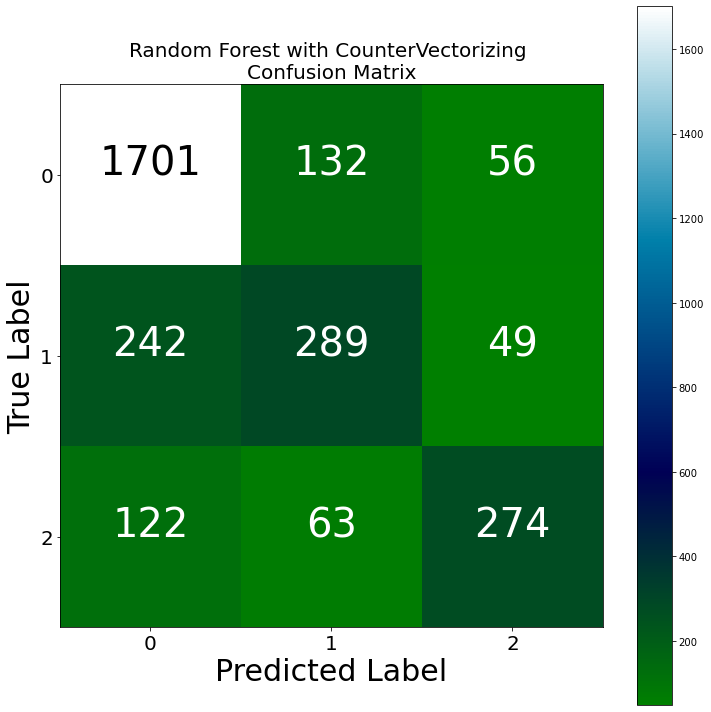

,Algorithm,balanced_accuracy,precision_score,recall_score,f1_score,roc_auc_ovo,roc_auc_ovr
0,Random Forest,0.665234,0.76304,0.773224,0.765204,0.748926,0.753298


<Figure size 432x288 with 0 Axes>

In [ ]:
eval_model(best_estimator_list, x_transformed, y_transformed, test_features, y_test)

In [ ]:
best_estimator_list

[('Random Forest',
  RandomForestClassifier(max_depth=100, max_features='sqrt', min_samples_leaf=2,
                         min_samples_split=10, n_estimators=800))]

Multinomial Naive Bayes

In [ ]:
# It accepts float value representing the additive smoothing parameter. 
alpha = [0.01, 0.1, 0.5, 1.0, 10.0]
# https://coderzcolumn.com/tutorials/machine-learning/scikit-learn-sklearn-naive-bayes#5

random_grid = {'alpha': alpha
               }

#init_metrics()
models =[]
params = []
params.append(random_grid)
models.append(('MultinomialNB',MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None)))
best_estimator_list = random_search(models, params, x_transformed, y_transformed)
print(best_estimator_list)

[('MultinomialNB', MultinomialNB(alpha=0.1, class_prior=None, fit_prior=True))]


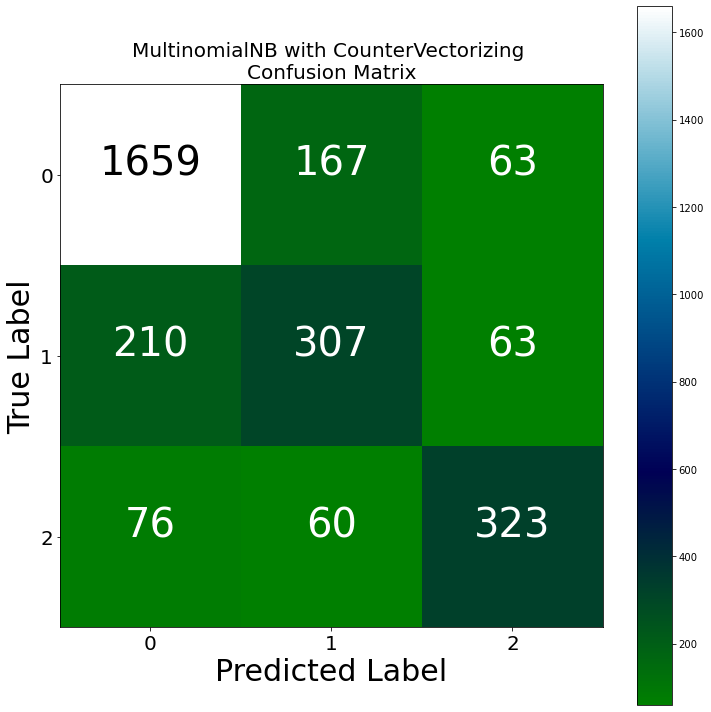

,Algorithm,balanced_accuracy,precision_score,recall_score,f1_score,roc_auc_ovo,roc_auc_ovr
0,Random Forest,0.665234,0.76304,0.773224,0.765204,0.748926,0.753298
1,MultinomialNB,0.703752,0.776938,0.781762,0.779031,0.777814,0.78138


<Figure size 432x288 with 0 Axes>

In [ ]:
eval_model(best_estimator_list, x_transformed, y_transformed, test_features, y_test)

In [ ]:
best_estimator_list

[('MultinomialNB', MultinomialNB(alpha=0.5))]

Linear SVC

In [ ]:
# C is the penalty parameter of the error term. 1100
# It controls the trade off between smooth decision boundary and classifying the training points correctly.
C = [1, 10, 100, 500]
# gamma is a parameter for non linear hyperplanes. 
# The higher the gamma value it tries to exactly fit the training data set
gamma = [0.1, 0.3, 0.5, 0.7]

random_grid = {'C': C,
               'gamma': gamma
               }

#init_metrics()
models =[]
params = []
params.append(random_grid)
models.append(('Linear SVC',svm.SVC(probability=True, class_weight='balanced', kernel='linear')))
best_estimator_list = random_search(models, params, x_transformed, y_transformed)
print(best_estimator_list)

[('Linear SVC', SVC(C=100, class_weight='balanced', gamma=0.5, kernel='linear',
    probability=True))]


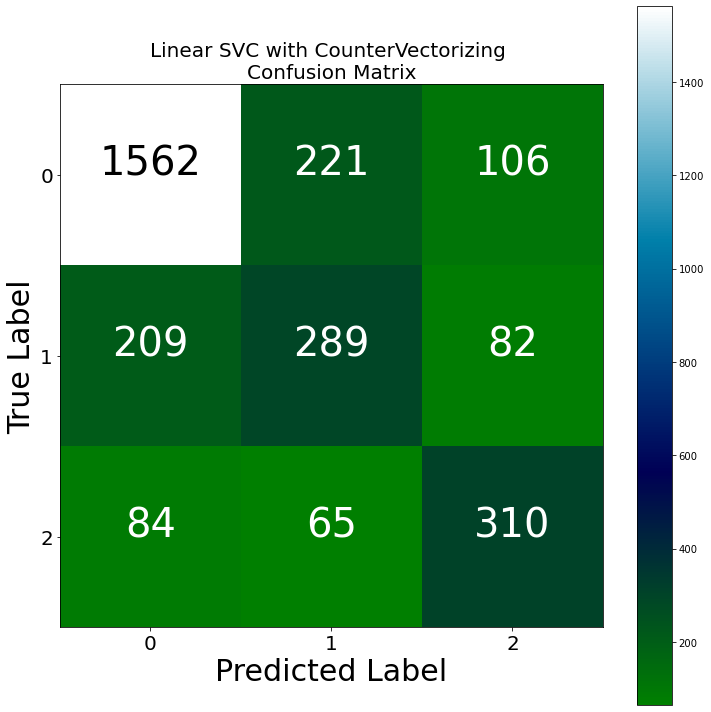

,Algorithm,balanced_accuracy,precision_score,recall_score,f1_score,roc_auc_ovo,roc_auc_ovr
0,Random Forest,0.665234,0.76304,0.773224,0.765204,0.748926,0.753298
1,MultinomialNB,0.703752,0.776938,0.781762,0.779031,0.777814,0.78138
2,Linear SVC,0.66685,0.740391,0.738046,0.739004,0.750137,0.753433


<Figure size 432x288 with 0 Axes>

In [ ]:
eval_model(best_estimator_list, x_transformed, y_transformed, test_features, y_test)

In [ ]:
best_estimator_list

[('Linear SVC',
  SVC(C=100, class_weight='balanced', gamma=0.5, kernel='linear',
      probability=True))]

Based on the results above, multinomial Naive Bayes has the best accuracy of 0.703752. Therefore, this algorithm will be used to further test for bigrams and trigrams to see if there will be any more improvements.

# Multinomial NB Bigram

Vocabulary length : 5000


aa agent  aa annoyed  aa customer  aa flight  aa lax  aa mile  aa no  \
0         0           0            0          0       0        0      0   
1         0           0            0          0       0        0      0   
2         0           0            0          0       0        0      0   
3         0           0            0          0       0        0      0   
4         0           0            0          0       0        0      0   

   aa not  aa ref  aa refsd  aa staff  aa usair  able check  able dm  \
0       0       0         0         0         0           0        0   
1       0       0         0         0         0           0        0   
2       0       0         0         0         0           0        0   
3       0       0         0         0         0           0        0   
4       0       0         0         0         0           0        0   

   able get  able give  able help  able leave  able put  able reach  \
0         0          0          0           0         0           0   
1         0          0          0           0         0           0   
2         0          0          0           0         0           0   
3         0          0          0           0         0           0   
4         0          0          0           0         0           0   

   able rebook  able reschedule  able use  abq annoyed  absolute worst  \
0            0                0         0            0               0   
1            0                0         0            0               0   
2            0                0         0            0               0   
3            0                0         0            0               0   
4            0                0         0            0               0   

   accept apple  accept refund  access journal  access website  access wsj  \
0             0              0               0               0           0   
1             0              0               0               0           0   
2             0              0               0               0           0   
3             0              0               0               0           0   
4             0              0               0               0           0   

   account dont  account help  across country  act together  actual person  \
0             0             0               0             0              0   
1             0             0               0             0              0   
2             0             0               0             0              0   
3             0             0               0             0              0   
4             0             0               0             0              0   

   actually flight  actually get  actually work  add child  add flight  \
0                0             0              0          0           0   
1                0             0              0          0           0   
2                0             0              0          0           0   
3                0             0              0          0           0   
4                0             0              0          0           0   

   add ktn  add lap  address issue  address please  address send  \
0        0        0              0               0             0   
1        0        0              0               0             0   
2        0        0              0               0             0   
3        0        0              0               0             0   
4        0        0              0               0             0   

   admiral club  agent available  agent busy  agent call  agent dfw  \
0             0                0           0           0          0   
1             0                0           0           0          0   
2             0                0           0           0          0   
3             0                0           0           0          0   
4             0                0           0           0          0   

   agent flight  agent gate 

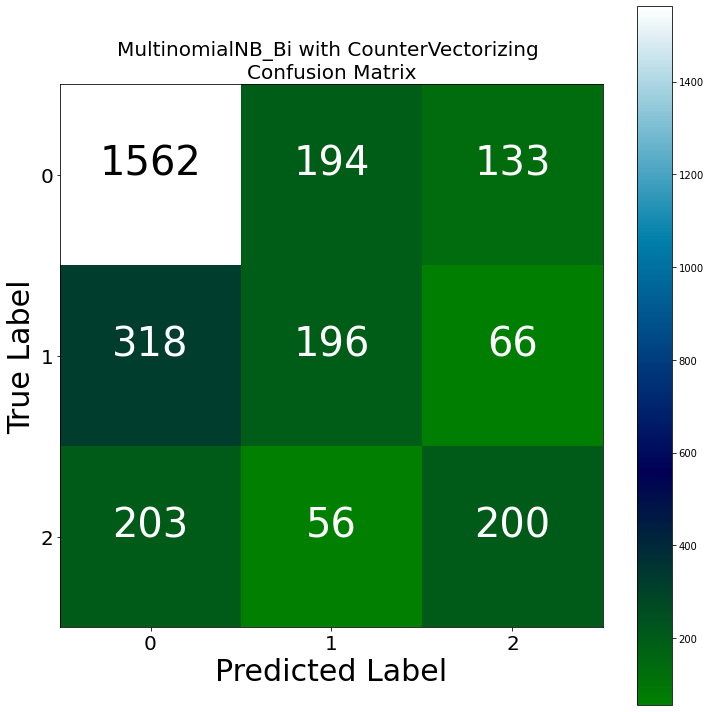

,Algorithm,balanced_accuracy,precision_score,recall_score,f1_score,roc_auc_ovo,roc_auc_ovr
0,MultinomialNB_Bi,0.533518,0.649415,0.668716,0.656179,0.650138,0.652006


In [ ]:
train_features, test_features = count_vec(X_train, X_test, 'Bigram') 

over = SMOTE()
under = RandomUnderSampler()
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)
x_transformed, y_transformed = pipeline.fit_resample(train_features, y_train)

best_estimator_list = [('MultinomialNB_Bi', MultinomialNB(alpha=0.5))]
eval_model(best_estimator_list, x_transformed, y_transformed, test_features, y_test)

# MultinomialNB Trigram

Vocabulary length : 5000


aa airline im  aa annoyed undecided  aa doesnt charge  aa gate supervisor  \
0              0                     0                 0                   0   
1              0                     0                 0                   0   
2              0                     0                 0                   0   
3              0                     0                 0                   0   
4              0                     0                 0                   0   

   aa going fix  aa gold flyer  aa not aware  aa not provide  aa ohio dallas  \
0             0              0             0               0               0   
1             0              0             0               0               0   
2             0              0             0               0               0   
3             0              0             0               0               0   
4             0              0             0               0               0   

   aa staff apologize  aadfw gma amso  able get flight  able get seat  \
0                   0               0                0              0   
1                   0               0                0              0   
2                   0               0                0              0   
3                   0               0                0              0   
4                   0               0                0              0   

   able trvlove guyshappy  abq annoyed undecided  accept apple pay  \
0                       0                      0                 0   
1                       0                      0                 0   
2                       0                      0                 0   
3                       0                      0                 0   
4                       0                      0                 0   

   access wsj content  accident way airport  acquisition flight aa  \
0                   0                     0                      0   
1                   0                     0                      0   
2                   0                     0                      0   
3                   0                     0                      0   
4                   0                     0                      0   

   add child reservation  add frequent flyer  add insult injury  \
0                      0                   0                  0   
1                      0                   0                  0   
2                      0                   0                  0   
3                      0                   0                  0   
4                      0                   0                  0   

   add ktn existing  add lap child  addl fee sit  address issue hold  \
0                 0              0             0                   0   
1                 0              0             0                   0   
2                 0              0             0                   0   
3                 0              0             0                   0   
4                 0              0             0                   0   

   address please thanks  agent flight aa  agent jacquie plitt  ago bf drop  \
0                      0                0                    0            0   
1                      0                0                    0            0   
2                      0                0                    0            0   
3                      0                0                    0            0   
4                      0                0                    0            0   

   ago still no  ago used old  ahold anyone help  air annoyed undecided  \
0             0             0                  0                      0   
1             0             0                  0                      0   
2             0             0                  0                      0   
3             0             0                  0                      0   
4             0             0                  0                      0   

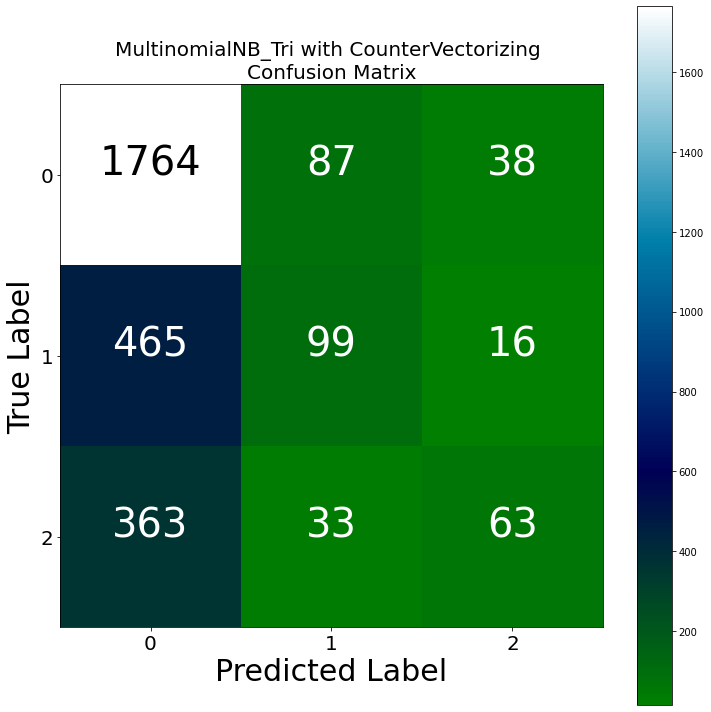

,Algorithm,balanced_accuracy,precision_score,recall_score,f1_score,roc_auc_ovo,roc_auc_ovr
0,MultinomialNB_Bi,0.533518,0.649415,0.668716,0.656179,0.650138,0.652006
1,MultinomialNB_Tri,0.413924,0.613017,0.657787,0.591322,0.560443,0.561979


In [ ]:
train_features, test_features = count_vec(X_train, X_test, 'Trigram') 

over = SMOTE()
under = RandomUnderSampler()
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)
x_transformed, y_transformed = pipeline.fit_resample(train_features, y_train)

best_estimator_list = [('MultinomialNB_Tri', MultinomialNB(alpha=0.5))]
eval_model(best_estimator_list, x_transformed, y_transformed, test_features, y_test)

In [ ]:
nb_data = {'ngram':['Unigram', 'Bigram', 'Trigram'],
        'balanced_accuracy':[0.703752, 0.533518, 0.413924],
        'precision_score':[0.776938, 0.649415, 0.613017],
        'recall_score':[0.781762, 0.668716, 0.657787],                                       
        'f1_score':[0.779031, 0.656179, 0.591322],
        'roc_auc_ovo':[0.777814, 0.650138, 0.560443],
        'roc_auc_ovr':[0.78138, 0.652006, 0.561979]  
}

# Create DataFrame
nb_data = pd.DataFrame(nb_data)
nb_data

,ngram,balanced_accuracy,precision_score,recall_score,f1_score,roc_auc_ovo,roc_auc_ovr
0,Unigram,0.703752,0.776938,0.781762,0.779031,0.777814,0.781380
1,Bigram,0.533518,0.649415,0.668716,0.656179,0.650138,0.652006
2,Trigram,0.413924,0.613017,0.657787,0.591322,0.560443,0.561979


In [ ]:
from bokeh.io import output_file, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap
from bokeh.palettes import Blues8
from bokeh.resources import INLINE
from bokeh.io import output_notebook
output_notebook(INLINE)


source = ColumnDataSource(nb_data)
algo = source.data['ngram'].tolist()

p = figure(x_range=algo, 
           plot_width=500, 
           plot_height=400, 
           title="Accuracy for Naive Bayes with N-grams",
           x_axis_label='ngram', 
           y_axis_label='balanced_accuracy'
          )

p.vbar(x='ngram', top='balanced_accuracy', width=0.5,source=source,
       fill_color=factor_cmap('ngram',
                                palette=Blues8,
                                factors=algo
                             ),
      )

p.xgrid.grid_line_color = None
p.y_range.start = 0

p.add_tools(HoverTool(
    tooltips=[
        ( 'ngram',   '@ngram' ),
        ( 'balanced_accuracy',   '@balanced_accuracy' ) # use @{ } for field names with spaces
    ],

    # display a tooltip whenever the cursor is vertically in line with a glyph
    mode='vline'
))


show(p)

From this experiment, unigram features still provides the highest accuracy for multinomial Naive bayes, whereas bigram and trigram features shows degrading results.

Other than usual machine learning algorithms, we also attempted three other different models to do the sentiment analysis, including ensemble classifier, BERT model and LSTM model.

# Ensemble Method

This ensemble methods combines the results of several models to produce better predictive performance compared to a single model. In our case, we passed the previous three algorithms (Multinomial Naive Bayes, Random Forest and SVM) into the classifier and used soft voting, which predict the class with the largest summed probability from models. (Hard voting predicts the class with the largest sum of votes from models.)

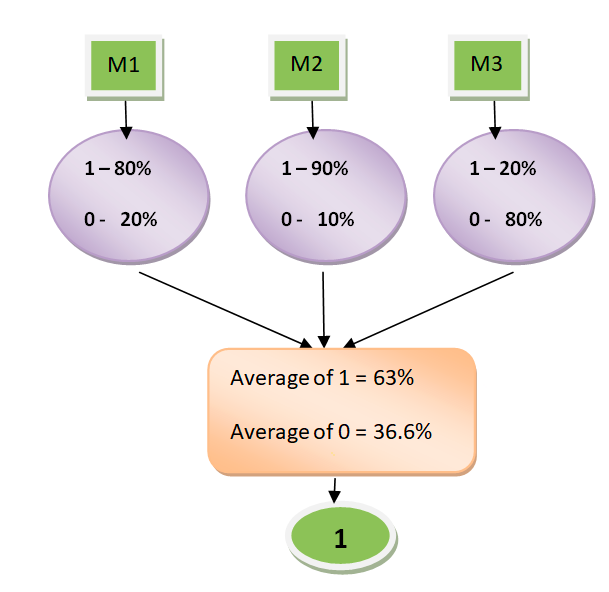

In [ ]:
best_estimator_list = [('Random Forest',RandomForestClassifier(max_depth=100, max_features='sqrt', min_samples_leaf=2,
                         min_samples_split=10, n_estimators=800)),
                       ('MultinomialNB', MultinomialNB(alpha=0.5)),
                       ('Linear SVC',SVC(C=100, class_weight='balanced', gamma=0.5, kernel='linear', probability=True))
                       ]
from sklearn.ensemble import VotingClassifier
model_list = []

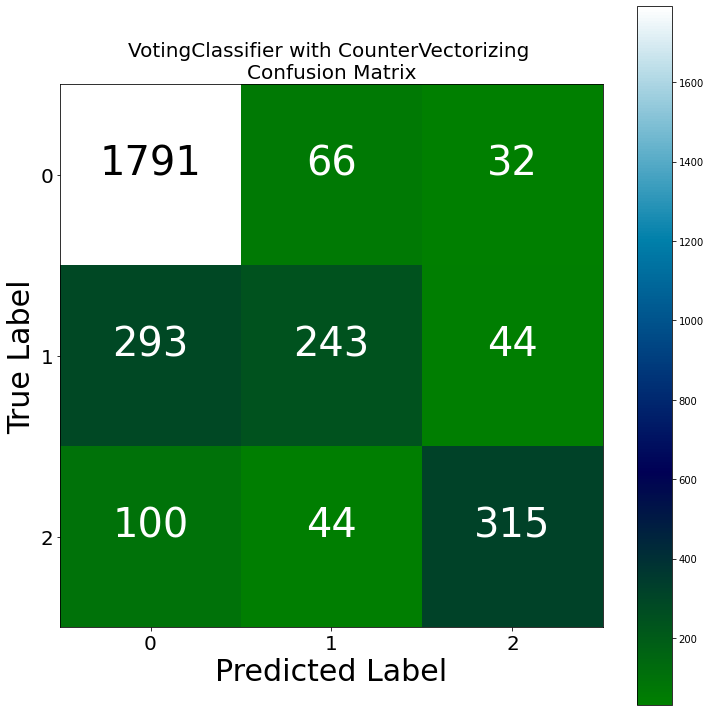

,Algorithm,balanced_accuracy,precision_score,recall_score,f1_score,roc_auc_ovo,roc_auc_ovr
0,VotingClassifier,0.684454,0.791711,0.802254,0.78675,0.76334,0.766247


In [ ]:
ensemble = VotingClassifier(best_estimator_list, voting ='soft')
model_list = []
model_list.append(('VotingClassifier',ensemble))
eval_model(model_list, train_features, y_train, test_features, y_test)

# Deep Learning

## Bidirectional Long Short Term Memory (LSTM)

LSTM networks are a type of recurrent neural network capable of learning order dependence in sequence prediction problems. A recurrent neural network (RNN) is a type of network with loops in them which allows information to persist. This means the network can connect previous information to the present task, such as a previous word in a sentence might inform on understanding of the present word.

RNNs in practice however have problems handling large gaps between information, or "long term dependencies". This is where LSTM comes in, which is a special kind of RNNs that can learn long-term dependencies. As they can "remember" information long-term, they are useful in a sentiment analysis context as oftentimes the sentiment of a sentence depends on a combination of words from the entire document, with large gaps in-between them.

Bidirectional LSTMs are an extension of traditional LSTMs, which train two LSTM instead of one on the input sequence, with the second LSTM trained on the reversed copy of the input sequence, which provides additional context to the network and results in faster and even fuller learning on the problem.


### LSTM Preprocessing 
1. Converting the sentiments into a binary class matrix 
2. Tokenizing the text and then converting it into an encoded form.
3. Padding the encoded text sequence so that all are of the same length.


In [ ]:
from tensorflow.keras.utils import to_categorical
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

#The number of vocubulary words in the X_train
max_words = len(set(" ".join(X_train).split()))

#The max length of a sentence in X_train
max_len = X_train.apply(lambda x: len(x)).max()


y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

tokenizer = Tokenizer(num_words=max_words, lower=True, split=' ')
tokenizer.fit_on_texts(df['lemmatized'])
# Transforms text to a sequence of integers
X_train_tokens = tokenizer.texts_to_sequences(X_train)
# Pad sequences to the same length
X_train_LSTM = pad_sequences(X_train_tokens, padding='post', maxlen=max_len)
X_test_tokens = tokenizer.texts_to_sequences(X_test)
# Pad sequences to the same length
X_test_LSTM = pad_sequences(X_test_tokens, padding='post', maxlen=max_len)

In [ ]:
from keras.models import Sequential
from keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, Dense, Dropout
from keras.metrics import Precision, Recall
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import RMSprop
from keras import datasets

from keras.callbacks import LearningRateScheduler
from keras.callbacks import History

from keras import losses

embedding_size = 32
epochs=20
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
# Build model
model= Sequential()
model.add(Embedding(max_words, embedding_size, input_length=max_len))
model.add(Conv1D(filters=32, kernel_size=3, padding='same', activation='relu'))
model.add(MaxPooling1D(pool_size=2))
model.add(Bidirectional(LSTM(32)))
model.add(Dropout(0.4))
model.add(Dense(3, activation='softmax'))

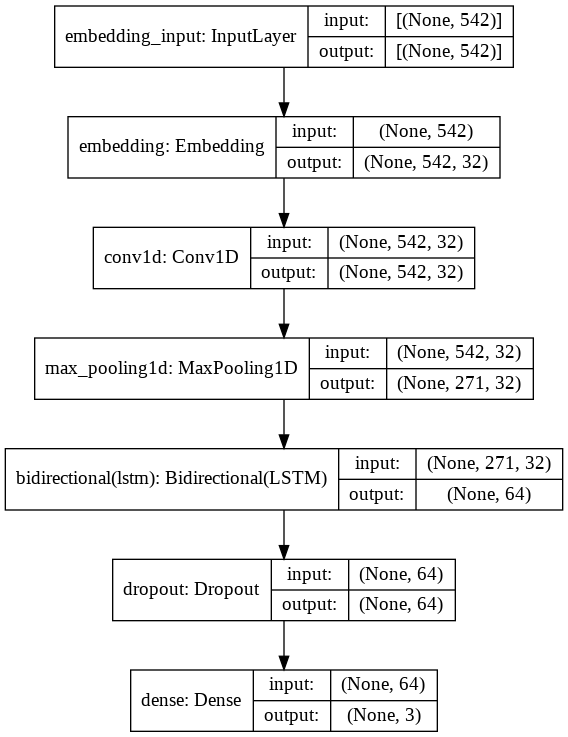

In [ ]:
import tensorflow as tf
import pydot
tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
print(model.summary())

# Compile model
model.compile(loss='categorical_crossentropy', optimizer=sgd, 
               metrics=['accuracy', Precision(), Recall()])

# Train model

batch_size = 64
history = model.fit(X_train_LSTM, y_train_cat,
                      validation_data=(X_test_LSTM, y_test_cat),
                      batch_size=batch_size, epochs=epochs, verbose=1)

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 542, 32)           353152    
_________________________________________________________________
conv1d (Conv1D)              (None, 542, 32)           3104      
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 271, 32)           0         
_________________________________________________________________
bidirectional (Bidirectional (None, 64)                16640     
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 3)                 195       
Total params: 373,091
Trainable params: 373,091
Non-trainable params: 0
________________________________________________

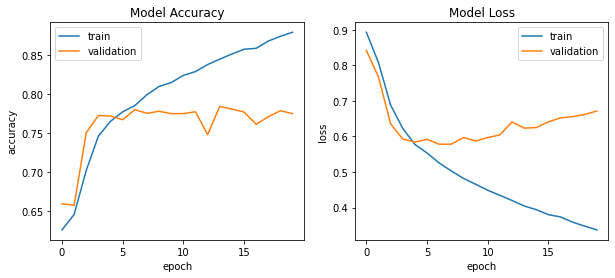

In [ ]:
def plot_training_hist(history):
    '''Function to plot history for accuracy and loss'''
    
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    # first plot
    ax[0].plot(history.history['accuracy'])
    ax[0].plot(history.history['val_accuracy'])
    ax[0].set_title('Model Accuracy')
    ax[0].set_xlabel('epoch')
    ax[0].set_ylabel('accuracy')
    ax[0].legend(['train', 'validation'], loc='best')
    # second plot
    ax[1].plot(history.history['loss'])
    ax[1].plot(history.history['val_loss'])
    ax[1].set_title('Model Loss')
    ax[1].set_xlabel('epoch')
    ax[1].set_ylabel('loss')
    ax[1].legend(['train', 'validation'], loc='best')
    
plot_training_hist(history)

In [ ]:
def plot_confusion_matrix(cm, classes,
                              normalize=False,
                              title = 'Confusion matrix',
                              cmap = plt.cm.ocean):
    """
    Create a confusion matrix plot for 'good' and 'bad' rating values 
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis = 1)[:, np.newaxis]
    plt.imshow(cm, interpolation = 'nearest', cmap = cmap)
    plt.title(title, fontsize = 20)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, fontsize = 20)
    plt.yticks(tick_marks, classes, fontsize = 20)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment = "center", 
                 color = "white" if cm[i, j] < thresh else "black", fontsize = 40)

    plt.tight_layout()
    plt.ylabel('True Label', fontsize = 30)
    plt.xlabel('Predicted Label', fontsize = 30)

def disp_confusion_matrix(y, y_pred, model_name, vector = 'CounterVectorizing'):
    """
    Display confusion matrix for selected model with countVectorizer
    """
    cm = confusion_matrix(y, y_pred)
    fig = plt.figure(figsize=(10, 10))
    plot = plot_confusion_matrix(cm, classes=[0, 1, 2], normalize=False, 
                                 title = model_name + " " + 'with' + " " + vector + " "+ '\nConfusion Matrix')
    plt.show()

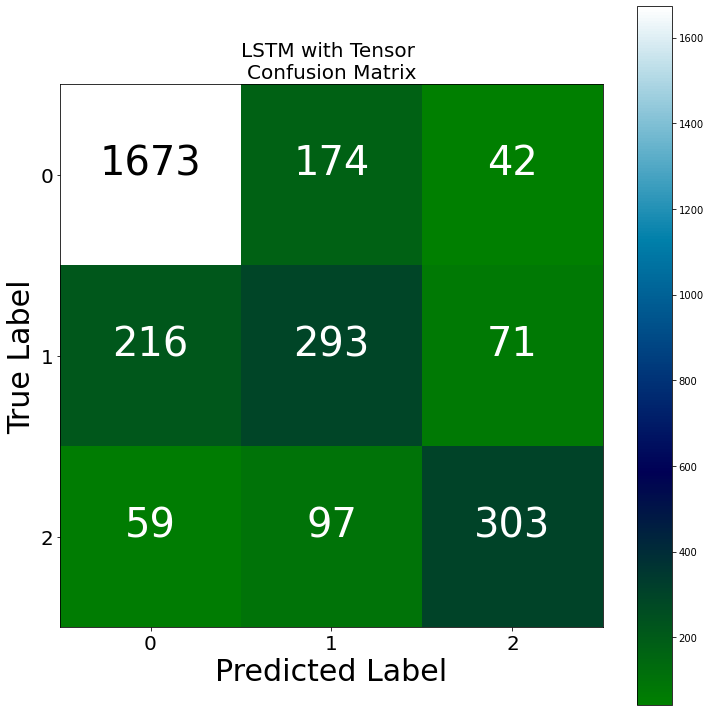

In [ ]:
y_pred = np.argmax(model.predict(X_test_LSTM), axis=-1)
import numpy as np
disp_confusion_matrix(y_test, y_pred, "LSTM", "Tensor")


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.89      0.87      1889
           1       0.52      0.51      0.51       580
           2       0.73      0.66      0.69       459

    accuracy                           0.77      2928
   macro avg       0.70      0.68      0.69      2928
weighted avg       0.77      0.77      0.77      2928



# Transfer Learning 

BERT model

*   Bidirectional Encoder Representation Transformer
*   Developed and made open source by Google Research Team
*   Pre trained model, trained on the entire Wikipedia and Book 
Corpus (in total 3,300 million words)
*   Deeply Bidirectional representations meaning the model learns information from left to right and from right to left

Why Fine Tuning
*   Quicker development
*   Less data is required
*   Better results


In [ ]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

There are 1 GPU(s) available.
We will use the GPU: Tesla K80


In [ ]:
# !pip install transformers

     |████████████████████████████████| 2.6 MB 4.2 MB/s 
     |████████████████████████████████| 636 kB 45.6 MB/s 
     |████████████████████████████████| 3.3 MB 38.5 MB/s 
     |████████████████████████████████| 895 kB 43.5 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


## Preprocessing in BERT

1.   De-Capitalization and Remove Punctuation: Punctuation and Capitalization model consists of punctuation and capitalization model followed by two token classification heads. One classification head is responsible for the punctuation task, the other one handles the capitalization task. Such architecture allows this model to solve two tasks at once with only a single pass through the BERT. So we don't have to do any changes here and just select the model (lowercase and uppercase) for our use case.
2.   Remove Stopword: In such models like BERT, all stopwords are kept to provide enough context information like the negation words (not, nor, never) which are considered to be stopwords. Surprisingly, the stopwords received as much attention as non-stop words, but removing them has no effect in mean reciprocal rank (MRR) performances. 
3.   Removing high-frequency words: BERT uses the Transformer model, which works on the attention principal. So when we finetune it on any problem, it will look only on those words which will impact the output and not on words which are common in all data.
4.   Stemming or Lemmatization: BERT uses BPE (Byte- Pair Encoding to shrink its vocab size), so words like run and running will ultimately be decoded to run + ##ing. So it's better not to convert running into run because, in some NLP problems, you need that information.
5.   Emoji: BERT tokenizer has vocabulary for emoji.  In total, 3627 emoji tokens are added to the vocabulary, both from the Unicode Standard and custom emoji. This is the reason we don't need to remove emoji from. 

In general, training BERT is usually on raw text without any text preprocessing. We can't use the previous preprocessed data because, in order to apply the pre-trained BERT, we must use the bert-tokenizer provided by the model. This is because the model has a specific, fixed vocabulary and the BERT tokenizer has a particular way of handling out-of-vocabulary words.







In [ ]:
# We start with the raw data. First we get the lists of sentences and their labels.
df['sentiment']= df['airline_sentiment'].apply(lambda x: 0 if x=='negative' else 1 if x=='neutral' else 2)
sentences = df.text.values
labels = df.sentiment.values

In [ ]:
from transformers import BertTokenizer

# Load the BERT tokenizer and we select the lowercase model (lower case the text irrespective of what we pass to the model).
print('Loading BERT tokenizer...')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

Loading BERT tokenizer...


Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
# Print the original sentence.
print(' Original: ', sentences[0])

# Print the sentence split into tokens.
print('Tokenized: ', tokenizer.tokenize(sentences[0]))

# Print the sentence mapped to token ids.
print('Token IDs: ', tokenizer.convert_tokens_to_ids(tokenizer.tokenize(sentences[0])))

 Original:  @VirginAmerica What @dhepburn said.
Tokenized:  ['@', 'virgin', '##ame', '##rica', 'what', '@', 'dh', '##ep', '##burn', 'said', '.']
Token IDs:  [1030, 6261, 14074, 14735, 2054, 1030, 28144, 13699, 8022, 2056, 1012]


We are required to:

1.   Add special tokens to the start and end of each sentence.
2.   Pad & truncate all sentences to a single constant length.
3.   Explicitly differentiate real tokens from padding tokens with the "attention mask".

BERT has two constraints:
1.   All sentences must be padded or truncated to a single, fixed length.
2.   The maximum sentence length is 512 tokens.

Special Tokens

[SEP]

At the end of every sentence, we need to append the special [SEP] token. This token is an artifact of two-sentence tasks, where BERT is given two separate sentences and asked to determine something.

[CLS]

For classification tasks, we must prepend the special [CLS] token to the beginning of every sentence. This token has special significance. BERT consists of 12 Transformer layers. Each transformer takes in a list of token embeddings, and produces the same number of embeddings on the output.



In [ ]:
# We'll transform our dataset into the format that BERT can be trained on.

max_len = 0

# For every sentence...
for sent in sentences:

    # Tokenize the text and add `[CLS]` and `[SEP]` tokens.
    input_ids = tokenizer.encode(sent, add_special_tokens=True)

    # Update the maximum sentence length.
    max_len = max(max_len, len(input_ids))

print('Max sentence length: ', max_len)

Max sentence length:  67


BertTokenizer come with a function to encode the data. The tokenizer.encode_plus function had combined multiple steps for us:


1.   Split the sentence into tokens (Tokenize)
2.   Prepend the [CLS] token to the start
3.   Append the [SEP] token to the end.
4.   Map tokens to their IDs.
5.   Pad or truncate the sentence to max_length
6.   Create the attention masks which explicitly differentiate real tokens from [PAD] tokens.


In [ ]:
# Just in case there are some longer test sentences, We’ll set the maximum length to 128.
# Tokenize all of the sentences and map the tokens to thier word IDs.
input_ids = []
attention_masks = []

for sent in sentences:
    encoded_dict = tokenizer.encode_plus(
                        sent,                      # Sentence to encode.
                        add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                        max_length = 128,           # Pad & truncate all sentences.
                        pad_to_max_length = True,
                        return_attention_mask = True,   # Construct attn. masks.
                        return_tensors = 'pt',     # Return pytorch tensors.
                   )
    
    # Add the encoded sentence to the list.    
    input_ids.append(encoded_dict['input_ids'])
    
    # And its attention mask (simply differentiates padding from non-padding).
    attention_masks.append(encoded_dict['attention_mask'])

# Convert the lists into tensors.
input_ids = torch.cat(input_ids, dim=0)
attention_masks = torch.cat(attention_masks, dim=0)
labels = torch.tensor(labels)

# Print sentence 0, now as a list of IDs.
print('Original: ', sentences[0])
print('Token IDs:', input_ids[0])

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Original:  @VirginAmerica What @dhepburn said.
Token IDs: tensor([  101,  1030,  6261, 14074, 14735,  2054,  1030, 28144, 13699,  8022,
         2056,  1012,   102,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
      

In [ ]:
# Divide up our dataset to use 80% for training and 20% for validation by using torch library.
from torch.utils.data import TensorDataset, random_split

# Combine the training inputs into a TensorDataset.
dataset = TensorDataset(input_ids, attention_masks, labels)

# Create a 80-20 train-validation split.

# Calculate the number of samples to include in each set.
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size

# Divide the dataset by randomly selecting samples.
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

print('{:>5,} training samples'.format(train_size))
print('{:>5,} validation samples'.format(val_size))

11,712 training samples
2,928 validation samples


In [ ]:
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler
# From torch we will use data loader, randomsampler to load data in an iterable format but extracting different subsamples from dataset.

# The DataLoader needs to know our batch size for training, so we specify it 
# here. For fine-tuning BERT on a specific task, the authors recommend a batch 
# size of 16 or 32.
# https://arxiv.org/pdf/1810.04805.pdf
batch_size = 32

# Create the DataLoaders for our training and validation sets.
# We'll take training samples in random order. 
dataloader_train = DataLoader(
            train_dataset,  # The training samples.
            sampler = RandomSampler(train_dataset), # Select batches randomly
            batch_size = batch_size # Trains with this batch size.
        )

# For validation the order doesn't matter, so we'll just read them sequentially.
dataloader_test  = DataLoader(
            val_dataset, # The validation samples.
            sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
            batch_size = batch_size # Evaluate with this batch size.
        )

Threre are differnt type of BERT model, each has different top layers and output types designed to accomodate their specific NLP task. Here is the current list of classes provided for fine-tuning:

*   BertModel
*   BertForPreTraining
*   BertForMaskedLM
*   BertForNextSentencePrediction
*   BertForSequenceClassification - The one we’ll use for sentence classifier
*   BertForTokenClassification
*   BertForQuestionAnswering


In [ ]:
from transformers import BertForSequenceClassification, AdamW, BertConfig

# Load BertForSequenceClassification, the pretrained BERT model with a single 
# linear classification layer on top. 
model = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased", # Use the 12-layer BERT model, with an uncased vocab.
    num_labels = 3, # The number of output labels.  
    output_attentions = False, # Whether the model returns attentions weights.
    output_hidden_states = False, # Whether the model returns all hidden-states.
)

# Tell pytorch to run this model on the GPU.
model.cuda()

Downloading:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

In [ ]:
optimizer = AdamW(model.parameters(),
                  lr = 2e-5, # args.learning_rate
                  eps = 1e-8 # args.adam_epsilon
                )

In [ ]:
from transformers import get_linear_schedule_with_warmup

# Number of training epochs. The BERT authors recommend between 2 and 4. 
# We chose to run for 4
epochs = 4

# Total number of training steps is [number of batches] x [number of epochs]. 
# (Note that this is not the same as the number of training samples).
total_steps = len(dataloader_train) * epochs

# Create the learning rate scheduler.
scheduler = get_linear_schedule_with_warmup(optimizer, 
                                            num_warmup_steps = 0,
                                            num_training_steps = total_steps)

In [ ]:
#Defining Model metrics
from sklearn.metrics import f1_score 
dict_label = {'negative':0, 'neutral': 1, 'positive':2}

# F1-score is a better metric when there are imbalanced classes as in the above case.
def f1_score_func(preds,labels):
    preds_flat = np.argmax(preds,axis=1).flatten()
    labels_flat = labels.flatten()
    return f1_score(labels_flat,preds_flat,average = 'weighted')

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

def accuracy_per_class(preds,labels):
    preds_flat = np.argmax(preds,axis=1).flatten()
    labels_flat = labels.flatten()
    
    for label in np.unique(labels_flat):
        y_preds = preds_flat[labels_flat==label]
        y_true = labels_flat[labels_flat==label]
        print(f"Class:{label}")
        print(f"Accuracy:{len(y_preds[y_preds==label])}/{len(y_true)}\n")

In [ ]:
import random

# Set the seed value all over the place to make this reproducible.
seed_val = 42

random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

In [ ]:
def evaluate(dataloader_val):
    model.eval()
    
    loss_val_total = 0
    predictions,true_vals = [],[]
    
    for batch in tqdm(dataloader_val):
        batch = tuple(b.to(device) for b in batch)
        
        inputs = {'input_ids':  batch[0],
                  'attention_mask':batch[1],
                  'labels': batch[2]
                 }
        with torch.no_grad():
            outputs = model(**inputs)
            
        loss = outputs[0]
        logits = outputs[1]
        loss_val_total +=loss.item()
        
        logits = logits.detach().cpu().numpy()
        label_ids = inputs['labels'].cpu().numpy()
        predictions.append(logits)
        true_vals.append(label_ids)
        
        
    loss_val_avg = loss_val_total/len(dataloader_val)  
    
    predictions = np.concatenate(predictions,axis=0)
    true_vals = np.concatenate(true_vals,axis=0) 
    return loss_val_avg,predictions,true_vals

In [ ]:
#Training Data
from tqdm.notebook import tqdm

for epoch in tqdm(range(1,epochs+1)):
    model.train()
    
    loss_train_total=0
    
    progress_bar = tqdm(dataloader_train,desc = "Epoch: {:1d}".format(epoch),leave = False,disable = False)
    
    for batch in progress_bar:
        model.zero_grad()
        
        batch = tuple(b.to(device) for b in batch)
        
        inputs = {
            "input_ids":batch[0],
            "attention_mask":batch[1],
            "labels":batch[2]
            
        }
        outputs = model(**inputs)
        
        loss = outputs[0]
#         logits = outputs[1]
        loss_train_total +=loss.item()
        loss.backward()
        
        torch.nn.utils.clip_grad_norm(model.parameters(),1.0)
        
        optimizer.step()
        scheduler.step()
        
        progress_bar.set_postfix({'training_loss':'{:.3f}'.format(loss.item()/len(batch))})
        #torch.save(model.state_dict(),f'/content/drive/My Drive/Colab Notebooks/BERT_ft_epoch{epoch}.model') #To save the model after each epoch
    
    tqdm.write('\nEpoch {epoch}')
    
    loss_train_avg = loss_train_total/len(dataloader_train)
    tqdm.write(f'Training Loss: {loss_train_avg}')
    val_loss,predictions,true_vals = evaluate(dataloader_test)
    test_score = flat_accuracy(predictions,true_vals)
    tqdm.write(f'Val Loss:{val_loss}\n Test Score:{test_score}')

  0%|          | 0/4 [00:00<?, ?it/s]

Epoch: 1:   0%|          | 0/366 [00:00<?, ?it/s]


Epoch {epoch}
Training Loss: 0.4989022509362854


  0%|          | 0/92 [00:00<?, ?it/s]

Val Loss:0.3950546631670516
 Test Score:0.8481414951753259


Epoch: 2:   0%|          | 0/366 [00:00<?, ?it/s]


Epoch {epoch}
Training Loss: 0.32393131325723695


  0%|          | 0/92 [00:00<?, ?it/s]

Val Loss:0.39811683681024157
 Test Score:0.8602890994547648


Epoch: 3:   0%|          | 0/366 [00:00<?, ?it/s]


Epoch {epoch}
Training Loss: 0.2237346139253


  0%|          | 0/92 [00:00<?, ?it/s]

Val Loss:0.4435149723582942
 Test Score:0.8568185231370773


Epoch: 4:   0%|          | 0/366 [00:00<?, ?it/s]


Epoch {epoch}
Training Loss: 0.1575575101652432


  0%|          | 0/92 [00:00<?, ?it/s]

Val Loss:0.4824120066250148
 Test Score:0.856018046489993


## Load Saved Model

We get an accuracy near 85% after just a few epochs. Lets select the epoch2 model (Test Score: 0.860) for our model evaluation.

In [ ]:
from transformers import BertForSequenceClassification
model = BertForSequenceClassification.from_pretrained('bert-base-uncased',
                                     num_labels = 3,
                                     output_attentions = False,
                                     output_hidden_states =  False)

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Testing Data
# model.to(device)
from tqdm.notebook import tqdm
model.cuda()
model.load_state_dict(torch.load(f'/content/drive/My Drive/Colab Notebooks/BERT_ft_epoch2.model'))
_,predictions,true_vals = evaluate(dataloader_test)
accuracy_per_class(predictions,true_vals)

  0%|          | 0/92 [00:00<?, ?it/s]

Class:0
Accuracy:1700/1843

Class:1
Accuracy:421/600

Class:2
Accuracy:388/485



[Text(0, 0.5, 'Positive'), Text(0, 1.5, 'Nuetral'), Text(0, 2.5, 'Negative')]

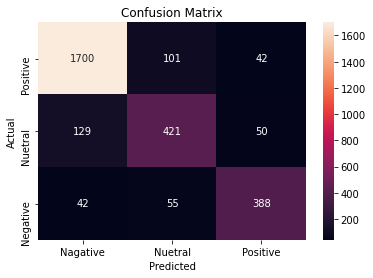

In [ ]:
import seaborn as sn
confusion_matrix = pd.crosstab(true_vals.flatten(), np.argmax(predictions,axis=1).flatten(), rownames=['Actual'], colnames=['Predicted'])
sn.heatmap(confusion_matrix, annot=True, fmt='.0f')
ax= plt.subplot()
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(['Nagative', 'Nuetral', 'Positive'])
ax.yaxis.set_ticklabels(['Positive', 'Nuetral', 'Nagative'])
# Typo in y-axis (['Negative', 'Nuetral', 'Positive']

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(true_vals.flatten(),np.argmax(predictions,axis=1).flatten()))

              precision    recall  f1-score   support

           0       0.91      0.92      0.92      1843
           1       0.73      0.70      0.72       600
           2       0.81      0.80      0.80       485

    accuracy                           0.86      2928
   macro avg       0.82      0.81      0.81      2928
weighted avg       0.86      0.86      0.86      2928



In [ ]:
def roc_auc_score_multiclass(actual_class, pred_class, average = "macro"):

  #creating a set of all the unique classes using the actual class list
  unique_class = set(actual_class)
  roc_auc_dict_ovr = {}
  roc_auc_dict_ovo = {}
  for per_class in unique_class:
    #creating a list of all the classes except the current class 
    other_class = [x for x in unique_class if x != per_class]

    #marking the current class as 1 and all other classes as 0
    new_actual_class = [0 if x in other_class else 1 for x in actual_class]
    new_pred_class = [0 if x in other_class else 1 for x in pred_class]

    #using the sklearn metrics method to calculate the roc_auc_score
    roc_auc_ovr = roc_auc_score(new_actual_class, new_pred_class, average = average, multi_class='ovr')
    roc_auc_dict_ovr[per_class] = roc_auc_ovr

    roc_auc_ovo = roc_auc_score(new_actual_class, new_pred_class, average = average, multi_class='ovo')
    roc_auc_dict_ovo[per_class] = roc_auc_ovo

  print("ovr: ", roc_auc_dict_ovr)
  print("ovo: ", roc_auc_dict_ovo)
  return roc_auc_dict_ovr, roc_auc_dict_ovo

roc_auc_multiclass_ovr = roc_auc_score_multiclass(true_vals.flatten(),np.argmax(predictions,axis=1).flatten())

ovr:  {0: 0.8824027144682457, 1: 0.8173281786941581, 2: 0.881170691772411}
ovo:  {0: 0.8824027144682457, 1: 0.8173281786941581, 2: 0.881170691772411}


# Evaluation

As a result, BERT model has the best accuracy out of all algorithm tested for this sentiment analysis training data. Therefore, it is selected to be deployed into our testing data to predict the sentiment of reviews towards Malaysia's three major airlines.

#Deployment

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Combine_airlines.csv to Combine_airlines.csv


In [ ]:
import io
df = pd.read_csv(io.BytesIO(uploaded['Combine_airlines.csv']))

In [ ]:
df['Airline'].value_counts()

malindo    464
mas        456
airasia    451
Name: Airline, dtype: int64

In [ ]:
df.head()

,Username,Review,Airline
0,Ritesh Aggarwal,Booked flight from Delhi to Sydney for my pare...,mas
1,Tara-lets T,I was looking for affordable airfare for multi...,mas
2,KING,I booked a flight from Delhi to KL on the 2 Ju...,mas
3,paul,Booked a flight with these thieves from Jakart...,mas
4,Mickey Pearson,With the E-Voucher Malaysia Airlines is forcin...,mas


In [ ]:
df.shape

(1371, 3)

In [ ]:
# Create sentence and label lists
sentences = df.Review.values

max_len = 0

# For every sentence...
for sent in sentences:

    # Tokenize the text and add `[CLS]` and `[SEP]` tokens.
    input_ids = tokenizer.encode(sent, add_special_tokens=True)

    # Update the maximum sentence length.
    max_len = max(max_len, len(input_ids))

print('Max sentence length: ', max_len)

Max sentence length:  225


In [ ]:
import pandas as pd

# Create sentence and label lists
sentences = df.Review.values
df['label'] = 0
labels = df.label.values

# Tokenize all of the sentences and map the tokens to thier word IDs.
input_ids = []
attention_masks = []


for sent in sentences:
    encoded_dict = tokenizer.encode_plus(
                        sent,                      # Sentence to encode.
                        add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                        max_length = 256,           # Pad & truncate all sentences.
                        pad_to_max_length = True,
                        return_attention_mask = True,   # Construct attn. masks.
                        return_tensors = 'pt',     # Return pytorch tensors.
                   )
    
    # Add the encoded sentence to the list.    
    input_ids.append(encoded_dict['input_ids'])
    
    # And its attention mask (simply differentiates padding from non-padding).
    attention_masks.append(encoded_dict['attention_mask'])

# Convert the lists into tensors.
input_ids = torch.cat(input_ids, dim=0)
attention_masks = torch.cat(attention_masks, dim=0)
labels = torch.tensor(labels)

# Set the batch size.  
batch_size = 32  

# Create the DataLoader.
prediction_data = TensorDataset(input_ids, attention_masks, labels)
prediction_sampler = SequentialSampler(prediction_data)
prediction_dataloader = DataLoader(prediction_data, sampler=prediction_sampler, batch_size=batch_size)

In [ ]:
_,predictions,true_vals = evaluate(prediction_dataloader)

  0%|          | 0/43 [00:00<?, ?it/s]

In [ ]:
df['Prediction'] = np.argmax(predictions,axis=1).flatten()
# df = df.drop(['label'], axis=1)

In [ ]:
print(df['Prediction'])

0       0
1       0
2       0
3       0
4       0
       ..
1366    0
1367    0
1368    0
1369    0
1370    0
Name: Prediction, Length: 1371, dtype: int64


In [ ]:
df['Prediction'].unique()

array([0, 1, 2])

In [ ]:
df.head()

,Username,Review,Airline,Prediction
0,Ritesh Aggarwal,Booked flight from Delhi to Sydney for my pare...,mas,0
1,Tara-lets T,I was looking for affordable airfare for multi...,mas,0
2,KING,I booked a flight from Delhi to KL on the 2 Ju...,mas,0
3,paul,Booked a flight with these thieves from Jakart...,mas,0
4,Mickey Pearson,With the E-Voucher Malaysia Airlines is forcin...,mas,0


In [ ]:
df.to_csv('/content/drive/My Drive/Colab Notebooks/MalaysiaAirline.csv')

# Malaysia Airline


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving MalaysiaAirline.csv to MalaysiaAirline.csv


In [ ]:
import io
import pandas as pd
df = pd.read_csv(io.BytesIO(uploaded['MalaysiaAirline.csv']))

In [ ]:
df['Airline'].value_counts()

malindo    464
mas        456
airasia    451
Name: Airline, dtype: int64

In [ ]:
pd.set_option('display.max_colwidth', None)
df.head()

,Unnamed: 0,Username,Review,Airline,Prediction
0,0,Ritesh Aggarwal,Booked flight from Delhi to Sydney for my parent and they keep on cancelling and extending flight. When it came for deduction they deducted on same day but now i got fed-up with them as they keep on extending ticket and try to cancel ticket which they send cancellation on.\n\nThey can't even tell how much they are deducting and then it will take 3-6 months to refund money in this digital age. They just know how to collect money and make make money from this SCAM. recommend NOT to BOOK AT ALL with them.,mas,0
1,1,Tara-lets T,"I was looking for affordable airfare for multiple flights, I saw airpaz offer which is very convincing but I still hesitated so I only booked one way ticket to check if they are legit, after they took the payment successfully I was waiting for the ticket to be email however hours and days passed by I never receive my ticket. Thank God I only booked one way it so I don't loose much but I feel sorry coz there are company like this operating and scamming people.",mas,0
2,2,KING,"I booked a flight from Delhi to KL on the 2 July. On the same day, in the evening, I was sent an email and my flight had been cancelled.\nI rebooked it on the 3 July and after 3 days I was sent another email that my flight was cancelled again!\nafter calling up, I was told the next available flight is on the 6 August and when I asked for a refund, they said, it will take 3-6 months to come!\nWTF man....\nClose the airlines down!! or sell it to me! I will show you how to run it !",mas,0
3,3,paul,"Booked a flight with these thieves from Jakarta to Adalaide Australia, 5 days after booking they cancel the flight with no.alternative flight available\nI then asked for a refund which they said would take between 3/6months, so now I'm left with no flight and no money to purchase from another airline.\nHow on earth are they allowed to get away with this is unbelievable and surley illegal, I've also noticed all similar offers have gone too, they are obviously just on a cash collecting scam along with Malindo owned by Malaysia air offering cheap flights that will never take off but they just keep collecting the money.\nDo not trust these thieves",mas,0
4,4,Mickey Pearson,"With the E-Voucher Malaysia Airlines is forcing onto their customers for flights and tickets they have cancelled, they are willingly practissing FRAUD, as the value the E Voucher is only a fraction of the cost the new portion of a return segment of the ticket would cost the customer.\n\nHere is an example:\nCancelled return portion of a ticket: Doha-K.L.-Denpasar\nE Voucher value Malaysia Airlines gives is: 3,100\nActual cost to buy a new ticket Doha-K.L.-Denpasar: MYR 10,250\n\nDefraud the passenger by Malaysia Airlines: MYR 7,150\n\nIt is absolutely shocking that the national carrier of Malaysia is so blatently practissing FRAUD on their clients/passengers and not honoring their purchased tickets, for which the client has already paid in full once before.\n\nThese are the corrupt and fraudulent business practices of Malaysia Airlines.",mas,0


## Restore labels 

In [ ]:
dict_label = {'negative':0, 'neutral': 1, 'positive':2}

def restore_label(prediction, dict_label):
  label = list(dict_label.keys())[list(dict_label.values()).index(prediction)]
  return label

df['Class'] = df['Prediction'].apply(restore_label, dict_label = dict_label)

In [ ]:
df[df['Class']=='negative'].head()

,Unnamed: 0,Username,Review,Airline,Prediction,Class
0,0,Ritesh Aggarwal,Booked flight from Delhi to Sydney for my pare...,mas,0,negative
1,1,Tara-lets T,I was looking for affordable airfare for multi...,mas,0,negative
2,2,KING,I booked a flight from Delhi to KL on the 2 Ju...,mas,0,negative
3,3,paul,Booked a flight with these thieves from Jakart...,mas,0,negative
4,4,Mickey Pearson,With the E-Voucher Malaysia Airlines is forcin...,mas,0,negative


In [ ]:
df.shape

(1371, 6)

In [ ]:
df['Class'].value_counts()

negative    1118
positive     226
neutral       27
Name: Class, dtype: int64

In [ ]:
df[df['Class']=='positive'].head()

,Unnamed: 0,Username,Review,Airline,Prediction,Class
44,44,Ethan L,The Cabin Crew are excellent on the flight. While flying with a little turbulence the pilot makes the flight comfortable.,mas,2,positive
54,54,Cher P,Our flight crew were fantastic on Malaysia Airlines 21st March 2020 . We had waited at the airport for 12 hours before our flight and we were so relieved it was not cancelled. The crew looked after us so well. They must have been just as stressed as us . There was a steward…,mas,2,positive
62,62,Peter s,"Kul - Syd return. Good flight over and great flight back. Malaysia Airlines economy product is almost always good. Though it does depend on the crew. On these two flights the crew were excellent, especially the return sector. Above and beyond in friendliness and ""can do""…",mas,2,positive
64,64,Alexgpringle,"For some years, they have been my first choice for flights to Malaysia. Comfortable modern aircraft (A350), friendly, enthusiastic staff and very nice food. For me, definitely preferable to BA.",mas,2,positive
66,66,Melroy P,"Great flt. Comfortable seats, with enough legspace for a tall person. The stewardess kept you fed well. Inflt ent was ok.",mas,2,positive


In [ ]:
from bokeh.io import output_file, show
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.transform import factor_cmap, cumsum
from bokeh.palettes import Blues8, Viridis256, Category20c
from bokeh.resources import INLINE
from math import pi
import pandas as pd
from bokeh.models.widgets import Panel, Tabs
from bokeh.io import output_notebook

# Sentiment Towards Malaysia Airlines

In [ ]:
def plot_piechart_sent(df, title):

  output_notebook(INLINE)
  df = df.groupby(by=['Class']).size()
  df = df.reset_index().rename({0:'Frequency'}, axis=1)
  df['Percentage'] = (df['Frequency'] / df['Frequency'].sum()) * 100
  df['angle'] = df['Frequency']/df['Frequency'].sum() * 2*pi
  df['color'] = Category20c[df.shape[0]]
  df = df.sort_values('Frequency', ascending = False)

  p = figure(plot_height=350, title=title, toolbar_location=None,
            tools="hover", tooltips="@Class:  @Percentage{0.2f}%")

  p.wedge(x=0, y=1, radius=0.4,
          start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
          line_color="white", fill_color='color', legend_field='Class', source=df)

  p.axis.axis_label=None
  p.axis.visible=False
  p.grid.grid_line_color = None
  return p

In [ ]:
sentiment_count_mas = df[df['Airline']=='mas']
sentiment_count_malindo = df[df['Airline']=='malindo']
sentiment_count_airasia = df[df['Airline']=='airasia']

In [ ]:
p_all = plot_piechart_sent(df,'Overall Sentiment Towards Malaysia Airlines')
p_mas = plot_piechart_sent(sentiment_count_mas,'Sentiment Towards MAS Airlines')
p_mal = plot_piechart_sent(sentiment_count_malindo,'Overall Sentiment Towards Malindo Airlines')
p_aa = plot_piechart_sent(sentiment_count_airasia,'Overall Sentiment Towards AirAsia Airlines')
tab0 = Panel(child=p_all, title="Overall")
tab1 = Panel(child=p_mas, title="MAS")
tab2 = Panel(child=p_mal, title="Malindo")
tab3 = Panel(child=p_aa, title="AirAsia")
tabs = Tabs(tabs=[ tab0, tab1, tab2, tab3 ])

show(tabs)

# WordCloud

Negative Word Cloud for AirAsia

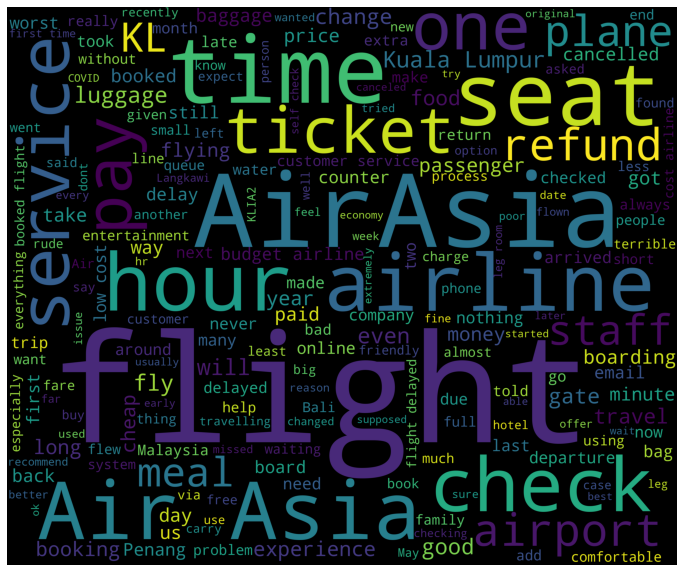

In [ ]:
negwordcloud_df = sentiment_count_airasia[sentiment_count_airasia['Class']=='negative']
words = ' '.join(negwordcloud_df['Review'])
cleaned_word = " ".join([word for word in words.split()
                         if 'http' not in word
                         and not word.startswith('@')
                         and word != 'RT'])

wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', width=3000, height=2500).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
d = WordCloud().process_text(cleaned_word)
wc_neg = pd.DataFrame(d.items())
wc_neg = wc_neg.rename(columns={0:'Word',1:'Count'}).sort_values(by=['Count'], ascending=False).reset_index().drop(['index'],axis=1)
wc_neg['Sentiment'] = 'Negative'
wc_neg.head(20)

,Word,Count,Sentiment
0,flight,313,Negative
1,AirAsia,113,Negative
2,time,91,Negative
3,seat,81,Negative
4,Air Asia,68,Negative
5,hour,67,Negative
6,airline,66,Negative
7,check,59,Negative
8,service,53,Negative
9,one,46,Negative


Positive Word Cloud for MAS

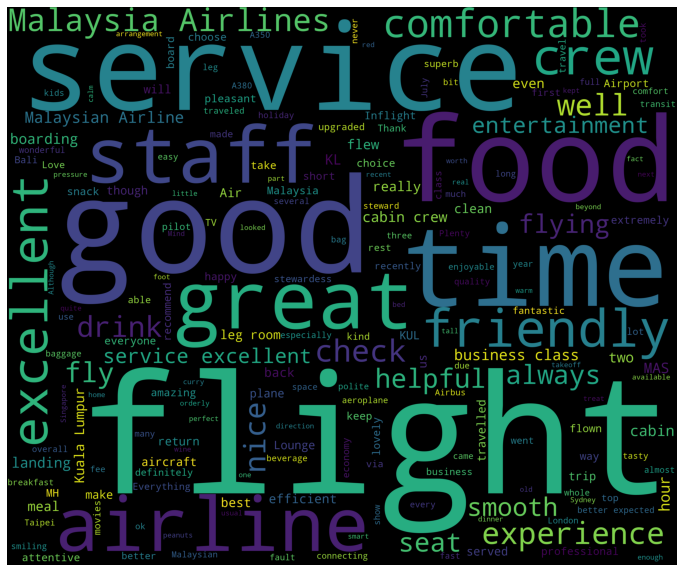

In [ ]:
poswordcloud_df=sentiment_count_mas[sentiment_count_mas['Class']=='positive']
words = ' '.join(poswordcloud_df['Review'])
cleaned_word = " ".join([word for word in words.split()
                         if 'http' not in word
                         and not word.startswith('@')
                         and word != 'RT'])

wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', width=3000, height=2500).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [ ]:
d = WordCloud().process_text(cleaned_word)
wc_pos = pd.DataFrame(d.items())
wc_pos = wc_pos.rename(columns={0:'Word',1:'Count'}).sort_values(by=['Count'], ascending=False).reset_index().drop(['index'],axis=1)
wc_pos['Sentiment'] = 'Positive'
wc_pos.head(20)

,Word,Count,Sentiment
0,flight,92,Positive
1,good,55,Positive
2,service,45,Positive
3,food,43,Positive
4,time,39,Positive
5,great,29,Positive
6,staff,27,Positive
7,airline,25,Positive
8,friendly,18,Positive
9,crew,17,Positive
